<a href="https://colab.research.google.com/github/choheeee22/Section2_Project/blob/main/Section2_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Walmart Data Description

Store - the store number

Date - the week

Temperature - average temperature in the region

Fuel_Price - cost of fuel in the region

MarkDown1-5 - anonymized data related to promotional markdowns that Walmart is 

running. MarkDown data is only available after Nov 2011, and is not available 

for all stores all the time. Any missing value is marked with an NA.

CPI - the consumer price index

Unemployment - the unemployment rate

IsHoliday - whether the week is a special holiday week

This is the historical training data, which covers to 2010-02-05 to 2012-11-01. Within this file you will find the following fields:

Store - the store number

Dept - the department number

Date - the week

Weekly_Sales -  sales for the given department in the given store

IsHoliday - whether the week is a special holiday week

In [1]:
#데이터 불러오기 (https://www.kaggle.com/c/walmart-recruiting-store-sales-forecasting/data)
from google.colab import files
uploaded= files.upload()

Saving EFFR (1).csv to EFFR (1).csv
Saving features.csv to features.csv
Saving stores.csv to stores.csv
Saving train.csv to train.csv


In [2]:
import pandas as pd 
effr=pd.read_csv("EFFR (1).csv")
features=pd.read_csv("features.csv")
stores=pd.read_csv("stores.csv")
train=pd.read_csv("train.csv")

In [3]:
#날짜 개수 - 143개여야 함 
(pd.to_datetime('2010-02-05')-pd.to_datetime('2012-11-01'))/7
#store 개수-45개 -> 데이터 6435
143*45
#Dept 개수-81 ->521235 (모든 dept 마다 데이터가 있는 건 아닌듯 )
143*45*81

521235

In [4]:
!pip install pandas-profiling==2.*

     |████████████████████████████████| 245 kB 30.4 MB/s 
     |████████████████████████████████| 62 kB 953 kB/s 
     |████████████████████████████████| 3.1 MB 57.6 MB/s 
     |████████████████████████████████| 675 kB 39.5 MB/s 
     |████████████████████████████████| 102 kB 72.1 MB/s 
     |████████████████████████████████| 812 kB 57.6 MB/s 
     |████████████████████████████████| 28.5 MB 46 kB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=b1086ba57a7649f82d9a29294cb2e910b7fc8ff28f6c4c42dda05ac05fe257b7
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295207 sha256=16a9cddccac45839eb9a07763801450cb14450e9ed1afaa20c76712cf2b917cf
  Stored in directory: /root/.cache/pip/wheels/4c/d5/59/5e3e297533ddb09407769762985d134135064c6831e29a914e
Successfully built htmlmin imagehash
  Attempting uninstall: scipy
  

In [5]:
features.head(3)
features

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False
...,...,...,...,...,...,...,...,...,...,...,...,...
8185,45,2013-06-28,76.05,3.639,4842.29,975.03,3.00,2449.97,3169.69,NaN,NaN,False
8186,45,2013-07-05,77.50,3.614,9090.48,2268.58,582.74,5797.47,1514.93,NaN,NaN,False
8187,45,2013-07-12,79.37,3.614,3789.94,1827.31,85.72,744.84,2150.36,NaN,NaN,False
8188,45,2013-07-19,82.84,3.737,2961.49,1047.07,204.19,363.00,1059.46,NaN,NaN,False


In [6]:
features[features.Store==1]

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False
...,...,...,...,...,...,...,...,...,...,...,...,...
177,1,2013-06-28,83.94,3.495,4205.98,796.70,6.84,3816.78,4812.74,NaN,NaN,False
178,1,2013-07-05,79.85,3.422,7649.99,3503.29,1766.77,9454.96,1079.89,NaN,NaN,False
179,1,2013-07-12,83.12,3.400,6089.94,1362.42,209.62,2367.42,2651.05,NaN,NaN,False
180,1,2013-07-19,79.26,3.556,3117.04,1060.39,199.05,1012.30,5381.72,NaN,NaN,False


In [7]:
#features 중 2012-11-01 (train 상 2012/10/26 이후 데이터 - over)/ features 에서 10/26 초과 데이터제거 -- features_2로 저장  (rows-6435)
features.Date.sort_values(ascending=False)
over=features[pd.to_datetime(features.Date)>pd.to_datetime("2012-10-26")]
over
features_2=features[~features['Date'].isin(over.Date)]
features_2.Date.sort_values(ascending=True)
features_2

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False
...,...,...,...,...,...,...,...,...,...,...,...,...
8146,45,2012-09-28,64.88,3.997,4556.61,20.64,1.50,1601.01,3288.25,192.013558,8.684,False
8147,45,2012-10-05,64.89,3.985,5046.74,NaN,18.82,2253.43,2340.01,192.170412,8.667,False
8148,45,2012-10-12,54.47,4.000,1956.28,NaN,7.89,599.32,3990.54,192.327265,8.667,False
8149,45,2012-10-19,56.47,3.969,2004.02,NaN,3.18,437.73,1537.49,192.330854,8.667,False


In [8]:
stores.head(3)

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392


In [9]:
train.head(3)
train.Store.nunique()
train.Dept.nunique()

81

In [10]:
train[train.Store==1]

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False
...,...,...,...,...,...
10239,1,99,2012-08-31,20.06,False
10240,1,99,2012-09-07,0.05,True
10241,1,99,2012-09-14,0.03,False
10242,1,99,2012-10-05,635.00,False


In [11]:
train.Date.sort_values(ascending=False)
train.Date.nunique()

143

In [12]:
#data 합치기 -df (rows-421570)
df=train.merge(features_2,on=["Store","Date"])
df=df.merge(stores,on="Store")
df

,Store,Dept,Date,Weekly_Sales,IsHoliday_x,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday_y,Type,Size
0,1,1,2010-02-05,24924.50,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315
1,1,2,2010-02-05,50605.27,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315
2,1,3,2010-02-05,13740.12,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315
3,1,4,2010-02-05,39954.04,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315
4,1,5,2010-02-05,32229.38,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
421565,45,93,2012-10-26,2487.80,False,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,False,B,118221
421566,45,94,2012-10-26,5203.31,False,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,False,B,118221
421567,45,95,2012-10-26,56017.47,False,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,False,B,118221
421568,45,97,2012-10-26,6817.48,False,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,False,B,118221


In [13]:
#df 'date' -unique - WeekList
WeekList=pd.DataFrame(df['Date'].unique(),columns=["U.DATE"])
WeekList["From"]=pd.to_datetime(WeekList["U.DATE"])-pd.to_timedelta(7,unit="d")
WeekList["To"]=WeekList["U.DATE"]
WeekList

,U.DATE,From,To
0,2010-02-05,2010-01-29,2010-02-05
1,2010-02-12,2010-02-05,2010-02-12
2,2010-02-19,2010-02-12,2010-02-19
3,2010-02-26,2010-02-19,2010-02-26
4,2010-03-05,2010-02-26,2010-03-05
...,...,...,...
138,2012-09-28,2012-09-21,2012-09-28
139,2012-10-05,2012-09-28,2012-10-05
140,2012-10-12,2012-10-05,2012-10-12
141,2012-10-19,2012-10-12,2012-10-19


In [14]:
#데이터 살펴보기
effr.head(20)
effr.columns

Index(['DATE', 'EFFR'], dtype='object')

In [15]:
WeekList['U.DATE'][0]
(pd.to_datetime(WeekList['U.DATE'][0])>=pd.to_datetime(WeekList['U.DATE'][0])-pd.to_timedelta(7))&(pd.to_datetime(effr['DATE'])<=pd.to_datetime(WeekList['U.DATE'][0]))

0       True
1       True
2       True
3       True
4       True
       ...  
714    False
715    False
716    False
717    False
718    False
Name: DATE, Length: 719, dtype: bool

In [16]:
effr.iloc[0]["DATE"]
effr['DATE'][0]

'2010-02-01'

In [17]:
#iterrow test
for index in WeekList.index:
  print(WeekList['U.DATE'][index])

2010-02-05
2010-02-12
2010-02-19
2010-02-26
2010-03-05
2010-03-12
2010-03-19
2010-03-26
2010-04-02
2010-04-09
2010-04-16
2010-04-23
2010-04-30
2010-05-07
2010-05-14
2010-05-21
2010-05-28
2010-06-04
2010-06-11
2010-06-18
2010-06-25
2010-07-02
2010-07-09
2010-07-16
2010-07-23
2010-07-30
2010-08-06
2010-08-13
2010-08-20
2010-08-27
2010-09-03
2010-09-10
2010-09-17
2010-09-24
2010-10-01
2010-10-08
2010-10-15
2010-10-22
2010-10-29
2010-11-05
2010-11-12
2010-11-19
2010-11-26
2010-12-03
2010-12-10
2010-12-17
2010-12-24
2010-12-31
2011-01-07
2011-01-14
2011-01-21
2011-01-28
2011-02-04
2011-02-11
2011-02-18
2011-02-25
2011-03-04
2011-03-11
2011-03-18
2011-03-25
2011-04-01
2011-04-08
2011-04-15
2011-04-22
2011-04-29
2011-05-06
2011-05-13
2011-05-20
2011-05-27
2011-06-03
2011-06-10
2011-06-17
2011-06-24
2011-07-01
2011-07-08
2011-07-15
2011-07-22
2011-07-29
2011-08-05
2011-08-12
2011-08-19
2011-08-26
2011-09-02
2011-09-09
2011-09-16
2011-09-23
2011-09-30
2011-10-07
2011-10-14
2011-10-21
2011-10-28

In [18]:
effr.index

RangeIndex(start=0, stop=719, step=1)

In [19]:
#zip test
for index, index2 in zip(effr.index,WeekList.index):
  print(effr['DATE'][index],WeekList['U.DATE'][index2])

2010-02-01 2010-02-05
2010-02-02 2010-02-12
2010-02-03 2010-02-19
2010-02-04 2010-02-26
2010-02-05 2010-03-05
2010-02-08 2010-03-12
2010-02-09 2010-03-19
2010-02-10 2010-03-26
2010-02-11 2010-04-02
2010-02-12 2010-04-09
2010-02-15 2010-04-16
2010-02-16 2010-04-23
2010-02-17 2010-04-30
2010-02-18 2010-05-07
2010-02-19 2010-05-14
2010-02-22 2010-05-21
2010-02-23 2010-05-28
2010-02-24 2010-06-04
2010-02-25 2010-06-11
2010-02-26 2010-06-18
2010-03-01 2010-06-25
2010-03-02 2010-07-02
2010-03-03 2010-07-09
2010-03-04 2010-07-16
2010-03-05 2010-07-23
2010-03-08 2010-07-30
2010-03-09 2010-08-06
2010-03-10 2010-08-13
2010-03-11 2010-08-20
2010-03-12 2010-08-27
2010-03-15 2010-09-03
2010-03-16 2010-09-10
2010-03-17 2010-09-17
2010-03-18 2010-09-24
2010-03-19 2010-10-01
2010-03-22 2010-10-08
2010-03-23 2010-10-15
2010-03-24 2010-10-22
2010-03-25 2010-10-29
2010-03-26 2010-11-05
2010-03-29 2010-11-12
2010-03-30 2010-11-19
2010-03-31 2010-11-26
2010-04-01 2010-12-03
2010-04-02 2010-12-10
2010-04-05

In [20]:
effr['WEEK']=0
effr

,DATE,EFFR,WEEK
0,2010-02-01,0.14,0
1,2010-02-02,0.14,0
2,2010-02-03,0.13,0
3,2010-02-04,0.14,0
4,2010-02-05,0.13,0
...,...,...,...
714,2012-10-26,0.16,0
715,2012-10-29,0.17,0
716,2012-10-30,0.17,0
717,2012-10-31,0.18,0


In [21]:
#new column 생성 test-안돼네
for index, index2 in zip(effr.index,WeekList.index):
  if 2+3==5:
    effr["WEEK"][index]=1

effr

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,DATE,EFFR,WEEK
0,2010-02-01,0.14,1
1,2010-02-02,0.14,1
2,2010-02-03,0.13,1
3,2010-02-04,0.14,1
4,2010-02-05,0.13,1
...,...,...,...
714,2012-10-26,0.16,0
715,2012-10-29,0.17,0
716,2012-10-30,0.17,0
717,2012-10-31,0.18,0


In [22]:
for index, index2 in zip(effr.index,WeekList.index):
    if pd.to_datetime(effr['DATE'][index])>=pd.to_datetime(WeekList['From'][index2]) and pd.to_datetime(effr['DATE'][index])<=pd.to_datetime(WeekList['To'][index2]):
      effr["WEEK"][index]=WeekList["U.DATE"][index2]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [23]:
effr

,DATE,EFFR,WEEK
0,2010-02-01,0.14,2010-02-05
1,2010-02-02,0.14,1
2,2010-02-03,0.13,1
3,2010-02-04,0.14,1
4,2010-02-05,0.13,1
...,...,...,...
714,2012-10-26,0.16,0
715,2012-10-29,0.17,0
716,2012-10-30,0.17,0
717,2012-10-31,0.18,0


In [24]:
for index, index2 in zip(effr.index,WeekList.index):
    if pd.to_datetime(effr['DATE'][index])>=pd.to_datetime(WeekList['From'][index2]) and pd.to_datetime(effr['DATE'][index])<=pd.to_datetime(WeekList['To'][index2]):
      effr.at[index,"WEEK"]=WeekList.at[index2,"U.DATE"]

In [25]:
effr

,DATE,EFFR,WEEK
0,2010-02-01,0.14,2010-02-05
1,2010-02-02,0.14,1
2,2010-02-03,0.13,1
3,2010-02-04,0.14,1
4,2010-02-05,0.13,1
...,...,...,...
714,2012-10-26,0.16,0
715,2012-10-29,0.17,0
716,2012-10-30,0.17,0
717,2012-10-31,0.18,0


In [26]:
#일단 profiling 으로 확인 
import pandas_profiling
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/30 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

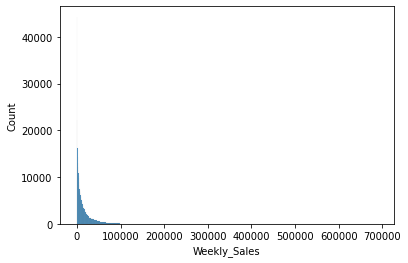

In [27]:
#시각화로 weekly sales 분포 확인 
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.histplot(df['Weekly_Sales']);#너무 right skewed 이네 



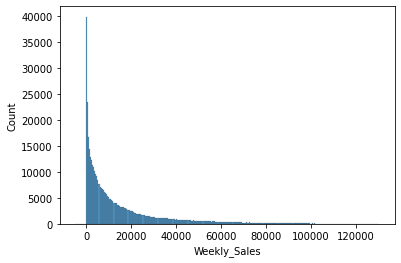

In [28]:
import numpy as np
df2=df[(df['Weekly_Sales'])<=np.percentile(df['Weekly_Sales'],99.5)]
sns.histplot(df2['Weekly_Sales']);

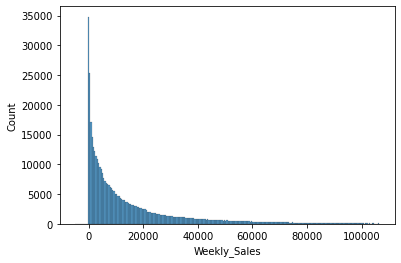

In [29]:
df3=df[(df['Weekly_Sales'])<=np.percentile(df['Weekly_Sales'],99)]
sns.histplot(df3['Weekly_Sales']);

In [30]:
#weekly sales ==0 값 확인하기 - 73개 정도면 없애도 될 거 같은데 -나중에 생각하기로 
df[df.Weekly_Sales==0]#73

,Store,Dept,Date,Weekly_Sales,IsHoliday_x,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday_y,Type,Size
4132,1,47,2011-03-11,0.0,False,53.56,3.459,NaN,NaN,NaN,NaN,NaN,214.111056,7.742,False,A,151315
5691,1,47,2011-08-12,0.0,False,90.76,3.638,NaN,NaN,NaN,NaN,NaN,215.605788,7.962,False,A,151315
5762,1,47,2011-08-19,0.0,False,89.94,3.554,NaN,NaN,NaN,NaN,NaN,215.669311,7.962,False,A,151315
10732,2,60,2010-03-19,0.0,False,54.52,2.720,NaN,NaN,NaN,NaN,NaN,210.873332,8.324,False,A,202307
18449,2,47,2012-04-13,0.0,False,68.08,3.891,8994.04,6573.08,20.21,4162.20,1966.38,221.148403,6.891,False,A,202307
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
402827,43,85,2012-01-13,0.0,False,43.68,3.261,894.04,209.71,32.36,NaN,1191.88,211.411571,9.653,False,C,41062
407180,44,27,2011-01-14,0.0,False,20.60,2.903,NaN,NaN,NaN,NaN,NaN,127.300935,7.224,False,C,39910
414388,45,54,2010-10-15,0.0,False,58.61,2.868,NaN,NaN,NaN,NaN,NaN,182.810620,8.724,False,B,118221
415525,45,47,2011-02-11,0.0,True,30.30,3.239,NaN,NaN,NaN,NaN,NaN,183.701613,8.549,True,B,118221


In [31]:
#group 별 weekly sales 봐보기 (dept, store, type)
df.groupby('Dept').Weekly_Sales.agg(['count','min','max','mean'])

,count,min,max,mean
Dept,,,,
1,6435,711.11,172225.55,19213.485088
2,6435,5453.18,151090.50,43607.020113
3,6435,2.00,131564.25,11793.698516
4,6435,4695.19,72179.92,25974.630238
5,6347,-0.04,259955.82,21365.583515
...,...,...,...,...
95,6435,11158.06,213042.66,69824.423080
96,4854,-63.80,63978.78,15210.942761
97,6278,-9.92,49034.16,14255.576919


<Figure size 432x288 with 0 Axes>

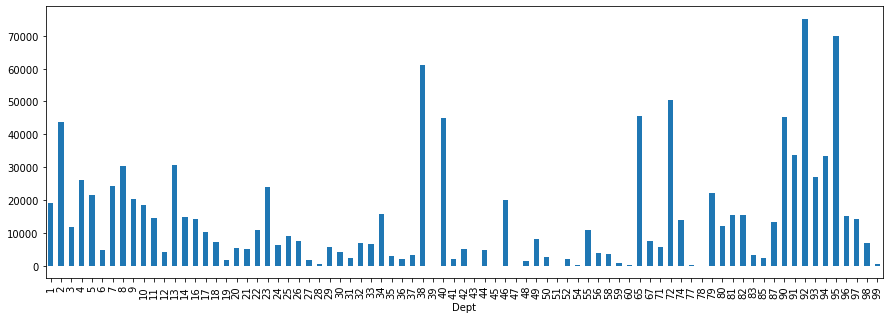

In [32]:
fig=plt.figure()
ax=plt.subplots(figsize=(15,5))
df.groupby('Dept').Weekly_Sales.mean().plot(kind='bar');

In [33]:
#store
df.groupby('Store').Weekly_Sales.agg(['count','min','max','mean'])

,count,min,max,mean
Store,,,,
1,10244,-863.00,203670.47,21710.543621
2,10238,-1098.00,285353.53,26898.070031
3,9036,-1008.96,155897.94,6373.033983
4,10272,-898.00,385051.04,29161.210415
5,8999,-101.26,93517.72,5053.415813
6,10211,-698.00,342578.65,21913.243624
7,9762,-459.00,222921.09,8358.766148
8,9895,-100.00,153431.69,13133.014768
9,8867,-496.00,139427.43,8772.890379


<Figure size 432x288 with 0 Axes>

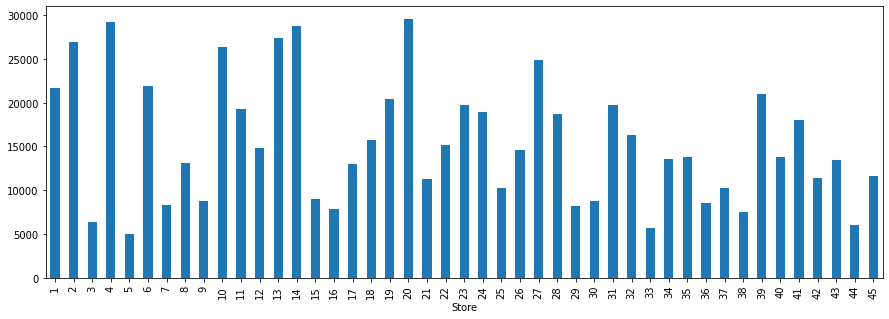

In [34]:
fig=plt.figure()
ax=plt.subplots(figsize=(15,5))
df.groupby('Store').Weekly_Sales.mean().plot(kind='bar');

In [35]:
#type
df.groupby("Type").Weekly_Sales.agg(['count','min','max','mean'])


,count,min,max,mean
Type,,,,
A,215478,-4988.94,474330.10,20099.568043
B,163495,-3924.00,693099.36,12237.075977
C,42597,-379.00,112152.35,9519.532538


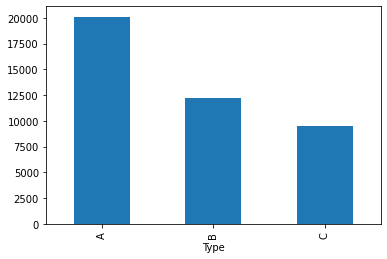

In [36]:
df.groupby("Type").Weekly_Sales.mean().plot(kind='bar');

In [37]:
#결측치 확인 - 아마 평균치로 대체 하면 될 거 같은데...결측치가 너무 많네... 
pd.DataFrame(df.isnull().sum(),columns=["결측치 개수"])

,결측치 개수
Store,0
Dept,0
Date,0
Weekly_Sales,0
IsHoliday_x,0
Temperature,0
Fuel_Price,0
MarkDown1,270889
MarkDown2,310322
MarkDown3,284479


In [38]:
#Mark down 결측치 확인 - 2012년 까지 도 있군...
df[df.MarkDown1.isna()==True].Date.sort_values(ascending=False)

397968    2012-10-26
398002    2012-10-26
397994    2012-10-26
397995    2012-10-26
397996    2012-10-26
             ...    
59061     2010-02-05
59062     2010-02-05
59063     2010-02-05
59064     2010-02-05
0         2010-02-05
Name: Date, Length: 270889, dtype: object

In [39]:
#데이터 분리 target=Weekly_Sales, 시계열 이므로 시간에 따라 분리하겠음 (2012-4-13)

import numpy as np 
df['Date'].sort_values(ascending=False).reset_index().iloc[84300] #20% 위치 확인 
con=pd.to_datetime(df['Date'])<pd.to_datetime("2012-04-13")
train=df.loc[con]
test=df.loc[~con]
test#85809
train#335761


,Store,Dept,Date,Weekly_Sales,IsHoliday_x,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday_y,Type,Size
0,1,1,2010-02-05,24924.50,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315
1,1,2,2010-02-05,50605.27,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315
2,1,3,2010-02-05,13740.12,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315
3,1,4,2010-02-05,39954.04,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315
4,1,5,2010-02-05,32229.38,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
419614,45,93,2012-04-06,2201.26,False,49.73,3.996,13450.45,NaN,26.59,3363.54,3962.01,190.685171,8.567,False,B,118221
419615,45,94,2012-04-06,2853.87,False,49.73,3.996,13450.45,NaN,26.59,3363.54,3962.01,190.685171,8.567,False,B,118221
419616,45,95,2012-04-06,52034.52,False,49.73,3.996,13450.45,NaN,26.59,3363.54,3962.01,190.685171,8.567,False,B,118221
419617,45,97,2012-04-06,6628.22,False,49.73,3.996,13450.45,NaN,26.59,3363.54,3962.01,190.685171,8.567,False,B,118221


In [40]:

#VAL도 분리  #hold out
train['Date'].sort_values(ascending=False).reset_index().iloc[60000] #20% 위치 확인 
con2=pd.to_datetime(df['Date'])<pd.to_datetime("2011-11-18")
val=train.loc[~con2]
train=train.loc[con2]
train#273103 
val#62658

,Store,Dept,Date,Weekly_Sales,IsHoliday_x,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday_y,Type,Size
6659,1,1,2011-11-18,19050.66,False,62.25,3.308,6074.12,254.39,51.98,427.39,5988.57,218.220509,7.866,False,A,151315
6660,1,2,2011-11-18,43997.78,False,62.25,3.308,6074.12,254.39,51.98,427.39,5988.57,218.220509,7.866,False,A,151315
6661,1,3,2011-11-18,10104.36,False,62.25,3.308,6074.12,254.39,51.98,427.39,5988.57,218.220509,7.866,False,A,151315
6662,1,4,2011-11-18,37656.58,False,62.25,3.308,6074.12,254.39,51.98,427.39,5988.57,218.220509,7.866,False,A,151315
6663,1,5,2011-11-18,27339.37,False,62.25,3.308,6074.12,254.39,51.98,427.39,5988.57,218.220509,7.866,False,A,151315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
419614,45,93,2012-04-06,2201.26,False,49.73,3.996,13450.45,NaN,26.59,3363.54,3962.01,190.685171,8.567,False,B,118221
419615,45,94,2012-04-06,2853.87,False,49.73,3.996,13450.45,NaN,26.59,3363.54,3962.01,190.685171,8.567,False,B,118221
419616,45,95,2012-04-06,52034.52,False,49.73,3.996,13450.45,NaN,26.59,3363.54,3962.01,190.685171,8.567,False,B,118221
419617,45,97,2012-04-06,6628.22,False,49.73,3.996,13450.45,NaN,26.59,3363.54,3962.01,190.685171,8.567,False,B,118221


In [41]:
#타겟 데이터 분리 
target='Weekly_Sales'
X_train=train.drop(target,axis=1)
y_train=train[target]
X_val=val.drop(target,axis=1)
y_val=val[target]
X_test=test.drop(target,axis=1)
y_test=test[target]
X_train, y_train
X_val, y_val
X_test, y_val

(        Store  Dept        Date  ...  IsHoliday_y  Type    Size
 8174        1     1  2012-04-13  ...        False     A  151315
 8175        1     2  2012-04-13  ...        False     A  151315
 8176        1     3  2012-04-13  ...        False     A  151315
 8177        1     4  2012-04-13  ...        False     A  151315
 8178        1     5  2012-04-13  ...        False     A  151315
 ...       ...   ...         ...  ...          ...   ...     ...
 421565     45    93  2012-10-26  ...        False     B  118221
 421566     45    94  2012-10-26  ...        False     B  118221
 421567     45    95  2012-10-26  ...        False     B  118221
 421568     45    97  2012-10-26  ...        False     B  118221
 421569     45    98  2012-10-26  ...        False     B  118221
 
 [85809 rows x 16 columns], 6659      19050.66
 6660      43997.78
 6661      10104.36
 6662      37656.58
 6663      27339.37
             ...   
 419614     2201.26
 419615     2853.87
 419616    52034.52
 419617    

In [42]:
#Base 라인 잡기 - weekly sales 평균치 
Base=y_train.mean()
Base

15876.703805743688

In [43]:
#평가지표 
#MAE-내가 예측한 못한 만큼 손해를 보기 때문에, 이상치에 대한 민감도에 크게 신경쓰지 않아도 되서 
#R2- 내 모델의 설명도를 보기 위해,- 이건 추가 검색 필요 


In [44]:
#가설 
#가설1 boosting 모델의 설명도가 더 좋을 것이다. 
#가설2 dept 에 따라 영향을 많이 끼치는 factor가 다를 것이다 
#가설3 직전 년도 동일 시기의 데이터와 비교시 연관도가 높을 것이다 (시즌 특성이 있으므로) - 고로 온도에 영향을 많이 받을 것이다 
#가설(?)4 직전년도 동일 시기 & 바로 전 2주 time stamp 등 최소로 관찰 가능한시기를 보고싶다 

In [45]:
#import library 
!pip install category_encoders
from category_encoders import TargetEncoder
from sklearn.impute import SimpleImputer, KNNImputer
# 사이킷런 - 파이프라인
from sklearn.pipeline import make_pipeline

# 사이킷런 - 학습모델
from sklearn.ensemble import RandomForestClassifier

# 사이킷런 - 모델 평가 지표
from sklearn.metrics import accuracy_score, mean_absolute_error, f1_score, we

# 
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, validation_curve

     |████████████████████████████████| 80 kB 8.3 MB/s 


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [46]:
X_train['Date']

0         2010-02-05
1         2010-02-05
2         2010-02-05
3         2010-02-05
4         2010-02-05
             ...    
418180    2011-11-11
418181    2011-11-11
418182    2011-11-11
418183    2011-11-11
418184    2011-11-11
Name: Date, Length: 273103, dtype: object

In [47]:
X_train['Date']=pd.to_datetime(X_train['Date']).astype(int)

In [48]:
X_train.dtypes

Store             int64
Dept              int64
Date              int64
IsHoliday_x        bool
Temperature     float64
Fuel_Price      float64
MarkDown1       float64
MarkDown2       float64
MarkDown3       float64
MarkDown4       float64
MarkDown5       float64
CPI             float64
Unemployment    float64
IsHoliday_y        bool
Type             object
Size              int64
dtype: object

In [49]:
#Linear Regression -아주 별로군...
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from category_encoders import OneHotEncoder

pipe1=make_pipeline(
    OneHotEncoder(use_cat_names=True),
    SimpleImputer(),
    LinearRegression()
)

pipe1.fit(X_train,y_train)
y_pred=pipe1.predict(X_train)

print("MAE:",mean_absolute_error(y_train,y_pred)), print("R2:",r2_score(y_train,y_pred))



/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


MAE: 14404.340661451086
R2: 0.08489015129118105


(None, None)

In [87]:

y_val_pred=pipe1.predict(X_val)

print("MAE:",mean_absolute_error(y_val,y_val_pred)), print("R2:",r2_score(y_val,y_val_pred))

MAE: 22398.69146420389
R2: -2.912632140203026


(None, None)

In [50]:
#multiple regression, pipe line 없이 - intercept & coef 보기 위해  -r2 0.0848
encoder=OneHotEncoder(use_cat_names=True)
X_train_oh=encoder.fit_transform(X_train)

Imputer=SimpleImputer()
X_train_oh_im=Imputer.fit_transform(X_train_oh)

model_ln=LinearRegression()
model_ln.fit(X_train_oh_im,y_train)
y_pred2=model_ln.predict(X_train_oh_im)

print("MAE:",mean_absolute_error(y_train,y_pred2)), print("R2:",r2_score(y_train,y_pred2))
model_ln.intercept_,model_ln.coef_


/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


MAE: 14404.340661451086
R2: 0.08489015129118105


(20277.12495076445,
 array([-9.03138954e+01,  1.11039419e+02, -1.49476953e-14, -3.79518144e-02,
         2.10980513e+01,  2.22166023e-02, -1.34010486e-02,  9.60821304e-02,
         3.14652583e+00,  1.28090912e-01, -8.02106612e-03, -1.97830981e+01,
        -1.15908626e+00, -3.79518144e-02, -4.35823381e-01,  1.16972876e+00,
        -7.33905375e-01,  8.65441435e-02]))

In [51]:
#base 와 비교 
Base_train=len(y_train)*[Base]
Base_train
print("MAE:",mean_absolute_error(y_train,Base_train)),print("R2:",r2_score(y_train,Base_train))

MAE: 14989.196914288948
R2: -2.220446049250313e-16


(None, None)

In [52]:
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv 
!rm ~/.cache/matplotlib -rf
import matplotlib as mpl
mpl.rc("font", family='NanumBarunGothic')


Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 40 not upgraded.
Need to get 9,604 kB of archives.
After this operation, 29.5 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fonts-nanum all 20170925-1 [9,604 kB]
Fetched 9,604 kB in 1s (10.1 MB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype

<Figure size 432x288 with 0 Axes>

findfont: Font family ['NanumBarunGothic'] not found. Falling back to DejaVu Sans.
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49440 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 54805 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 54924 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 44480 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 44208 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/bac

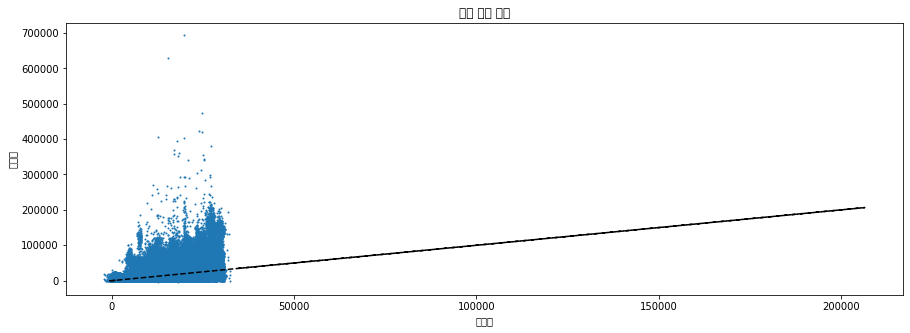

In [53]:
#예측치 실제값 그래프 -이게 뭐야.. ㅠㅠ
fig=plt.figure()
ax=plt.subplots(figsize=(15,5))
plt.scatter(y_pred,y_train,s=1);
plt.title ("선형 회귀 결과")
plt.xlabel("예측값")
plt.ylabel("실젯값")  
plt.plot(y_test,y_test,'k--')
plt.show()

In [54]:
#noramlize 한 선형 회귀 -의미없네.. -r2 0.0848
from sklearn.preprocessing import normalize


encoder=OneHotEncoder(use_cat_names=True)
X_train_oh=encoder.fit_transform(X_train)

Imputer=SimpleImputer()
X_train_oh_im=Imputer.fit_transform(X_train_oh)

X_train_oh_im_n=normalize(X_train_oh_im)

model_ln2=LinearRegression()
model_ln2.fit(X_train_oh_im_n,y_train)
y_pred3=model_ln2.predict(X_train_oh_im_n)

print("MAE:",mean_absolute_error(y_train,y_pred2)), print("R2:",r2_score(y_train,y_pred2))
model_ln2.intercept_,model_ln2.coef_


/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


MAE: 14404.340661451086
R2: 0.08489015129118105


(100069668.50931399,
 array([-1.79968506e+20,  1.41997944e+20, -1.00065280e+08,  6.40629599e+20,
         1.97110065e+19,  1.10119067e+19,  5.79826860e+16,  9.04017284e+16,
         4.74330616e+18,  5.09424550e+16,  8.91516551e+16, -3.29651871e+19,
        -2.44490175e+20,  6.40629599e+20, -2.61335680e+21, -3.02373562e+21,
         4.58089625e+21,  1.25823619e+17]))

In [55]:
#라쏘 -r2 0.08866
from sklearn.linear_model import Lasso



encoder=OneHotEncoder(use_cat_names=True)
X_train_oh=encoder.fit_transform(X_train)

Imputer=SimpleImputer()
X_train_oh_im=Imputer.fit_transform(X_train_oh)

model_lasso=Lasso()
model_lasso.fit(X_train_oh_im,y_train)

y_pred4=model_lasso.predict(X_train_oh_im)

print("MAE:",mean_absolute_error(y_train,y_pred4)), print("R2:",r2_score(y_train,y_pred4))


/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


MAE: 14410.905416122298
R2: 0.08866727024903476


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62469125680027.68, tolerance: 13729289634.776232
  positive)


(None, None)

In [58]:
X_val['Date']=pd.to_datetime(X_val['Date']).astype(int)

In [100]:
#random forest - r2 0.99 이게 말이 돼냐... -하이퍼 파라미터 튜닝 필요할 듯 
from sklearn.ensemble import RandomForestRegressor
from category_encoders import OrdinalEncoder

pipe2=make_pipeline(
    OrdinalEncoder(),
    SimpleImputer(),
    RandomForestRegressor(random_state=2,n_jobs=-1)
)

pipe2.fit(X_train,y_train)
y_pred5=pipe2.predict(X_train)

print("MAE:",mean_absolute_error(y_train,y_pred5)), print("R2:",r2_score(y_train,y_pred5))
print('검증 정확도: ', pipe2.score(X_val, y_val))


MAE: 576.4021249726294
R2: 0.9948923603555544
검증 정확도:  0.827127343353713


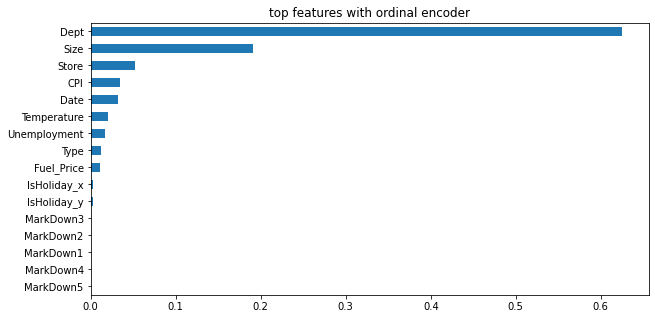

In [101]:
#특성 중요도 

from sklearn.tree import export_graphviz
rf = pipe2.named_steps['randomforestregressor']
importances=pd.Series(rf.feature_importances_,X_train.columns)

n=20
plt.figure(figsize=(10,n/4))
plt.title("top features with ordinal encoder")
importances.sort_values()[-n:].plot.barh();


In [96]:
!pip install plotly ==1.*

ERROR: Invalid requirement: '==1.*'


In [105]:
#random forest hyper parameter tuning
def test_params(**params):  
  pipe2=make_pipeline(
    OrdinalEncoder(),
    SimpleImputer(),
    RandomForestRegressor(random_state=2,n_jobs=-1,**params)
)
  pipe2.fit(X_train, y_train)

  train_mae = mean_absolute_error(y_train,pipe2.predict(X_train))
  #train_r2=r2_score(y_train,model.predict(X_train)
  val_mae= mean_absolute_error(X_val,pipd2.predict(X_val))
  return train_mae,val_mae

In [106]:
def test_param_and_plot(param_name, param_values):
    train_errors, val_errors = [], [] 
    for value in param_values:
        params = {param_name: value}
        train_mae, val_mae = test_params(**params)
        train_errors.append(train_mae)
        val_errors.append(val_mae)
    plt.figure(figsize=(16,8))
    plt.title('Overfitting curve: ' + param_name)
    plt.plot(param_values, train_errors, 'b-o')
    plt.plot(param_values, val_errors, 'r-o')
    plt.xlabel(param_name)
    plt.ylabel('MAE')
    plt.legend(['Training', 'Validation'])

In [ ]:
test_param_and_plot('max_depth', [5, 10, 15, 20, 25, 30, 35])

In [59]:
!pip install eli5

     |████████████████████████████████| 106 kB 36.1 MB/s 


In [72]:
#permutation importance
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import eli5
from eli5.sklearn import PermutationImportance

from sklearn.pipeline import Pipeline
# encoder, imputer를 preprocessing으로 묶었습니다. 후에 eli5 permutation 계산에 사용합니다
pipe3 = Pipeline([
    ('preprocessing', make_pipeline(OrdinalEncoder(),SimpleImputer())),
    ('rf', RandomForestRegressor()) 
])

pipe3.fit(X_train,y_train)
print('검증 정확도: ', pipe3.score(X_val, y_val))


검증 정확도:  0.8264647845062869


In [64]:
pipe3.named_steps

{'preprocessing': Pipeline(memory=None,
          steps=[('ordinalencoder',
                  OrdinalEncoder(cols=None, drop_invariant=False,
                                 handle_missing='value', handle_unknown='value',
                                 mapping=None, return_df=True, verbose=0)),
                 ('simpleimputer',
                  SimpleImputer(add_indicator=False, copy=True, fill_value=None,
                                missing_values=nan, strategy='mean',
                                verbose=0))],
          verbose=False),
 'rf': RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=None, oob_score=False,
     

In [67]:
X_val.dtypes

Store             int64
Dept              int64
Date              int64
IsHoliday_x        bool
Temperature     float64
Fuel_Price      float64
MarkDown1       float64
MarkDown2       float64
MarkDown3       float64
MarkDown4       float64
MarkDown5       float64
CPI             float64
Unemployment    float64
IsHoliday_y        bool
Type             object
Size              int64
dtype: object

In [74]:
# permuter 정의
permuter = PermutationImportance(
    pipe3.named_steps['rf'], # model
    scoring='r2', # metric
    n_iter=5, # 다른 random seed를 사용하여 5번 반복
    random_state=2
)

# permuter 계산은 preprocessing 된 X_val을 사용합니다.
X_val_transformed = pipe3.named_steps['preprocessing'].transform(X_val)

# 실제로 fit 의미보다는 스코어를 다시 계산하는 작업입니다
permuter.fit(X_val_transformed, y_val);

In [75]:
feature_names = X_val.columns.tolist()
pd.Series(permuter.feature_importances_, feature_names).sort_values()

IsHoliday_y    -0.001684
IsHoliday_x    -0.000559
MarkDown2      -0.000187
MarkDown5      -0.000153
MarkDown4      -0.000147
MarkDown1      -0.000068
Date            0.000000
MarkDown3       0.000878
Temperature     0.001895
Fuel_Price      0.002756
Unemployment    0.012468
Type            0.018449
CPI             0.048166
Store           0.104385
Size            0.501033
Dept            1.462369
dtype: float64

In [76]:
# 특성별 score 확인
eli5.show_weights(
    permuter, 
    top=None, # top n 지정 가능, None 일 경우 모든 특성 
    feature_names=feature_names # list 형식으로 넣어야 합니다
)

Weight,Feature
1.4624 ± 0.0216,Dept
0.5010 ± 0.0195,Size
0.1044 ± 0.0023,Store
0.0482 ± 0.0014,CPI
0.0184 ± 0.0014,Type
0.0125 ± 0.0017,Unemployment
0.0028 ± 0.0006,Fuel_Price
0.0019 ± 0.0014,Temperature
0.0009 ± 0.0001,MarkDown3
0 ± 0.0000,Date


In [77]:
#decision tree regressor -r2가 1 이네.....
from sklearn.tree import DecisionTreeRegressor


pipe4=make_pipeline(
    OrdinalEncoder(),
    SimpleImputer(),
    DecisionTreeRegressor()
)

pipe4.fit(X_train,y_train)
y_pred6=pipe3.predict(X_train)

print("MAE:",mean_absolute_error(y_train,y_pred6)), print("R2:",r2_score(y_train,y_pred6))
print('검증 정확도: ', pipe4.score(X_val, y_val))

MAE: 574.8269483249909
R2: 0.994856521603932
검증 정확도:  0.7603344988211584


In [89]:
#decision tree graphviz
import graphviz
from sklearn.tree import export_graphviz

def show_tree(tree, colnames):
    dot = export_graphviz(tree, feature_names=colnames, filled=True, rounded=True)   
    return graphviz.Source(dot)

tree = pipe4.named_steps['decisiontreeregressor']
show_tree(tree, colnames=X_train.columns)




KeyboardInterrupt: ignored

In [ ]:
#xgboost
!pip install xgboost


In [79]:
#boosting
from xgboost import XGBRegressor

pipe5 = make_pipeline(
    OrdinalEncoder(),
    SimpleImputer(),
    XGBRegressor()
)

pipe5.fit(X_train, y_train);
print('검증 정확도: ', pipe4.score(X_val, y_val))

[04:19:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
검증 정확도:  0.7603344988211584
